In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.model_selection import train_test_split
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
%matplotlib inline
from sklearn.datasets import load_files       
from keras.utils import np_utils
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import backend as K
from keras.callbacks import EarlyStopping, ModelCheckpoint
import numpy as np
from glob import glob
import keras
from keras.preprocessing import image                  
from tqdm import tqdm
from random import shuffle 
import os, os.path
import imageio
import math
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.utils import class_weight
import cv2

In [2]:
data_dir =  "data"
#image_source_dir = data_dir + "/originals"

In [3]:
image_dest_dir = data_dir + "//f_data"

In [4]:
dir_list_1 = (os.listdir(image_dest_dir))
dir_list_1

['test', 'train', 'valid']

In [5]:
test_dir_path = image_dest_dir+'\\'+dir_list_1[0]
train_dir_path = image_dest_dir+'\\'+dir_list_1[1]
valid_dir_path = image_dest_dir+'\\'+dir_list_1[2]

In [6]:
os.listdir(train_dir_path)

['abnormal', 'normal']

In [7]:
for i in range(len(dir_list_1)):
    dir_list_2 = os.listdir(image_dest_dir+'\\'+dir_list_1[i])
print(dir_list_2)
    

['abnormal', 'normal']


In [8]:
print("\t\tTrain DataSet")
print("CT scans with adenocarcinoma          : " + str(len(os.listdir(train_dir_path+'\\'+dir_list_2[0]))))
print("CT scans with normal                  : " + str(len(os.listdir(train_dir_path+'\\'+dir_list_2[1]))))

print("\n\t\tTest DataSet")
print("CT scans with adenocarcinoma          : " + str(len(os.listdir(test_dir_path+'\\'+dir_list_2[0]))))
print("CT scans with normal                  : " + str(len(os.listdir(test_dir_path+'\\'+dir_list_2[1]))))

print("\n\t\tvalid DataSet")
print("CT scans with adenocarcinoma          : " + str(len(os.listdir(valid_dir_path+'\\'+dir_list_2[0]))))
print("CT scans with normal                  : " + str(len(os.listdir(valid_dir_path+'\\'+dir_list_2[1]))))


		Train DataSet
CT scans with adenocarcinoma          : 195
CT scans with normal                  : 148

		Test DataSet
CT scans with adenocarcinoma          : 120
CT scans with normal                  : 54

		valid DataSet
CT scans with adenocarcinoma          : 23
CT scans with normal                  : 13


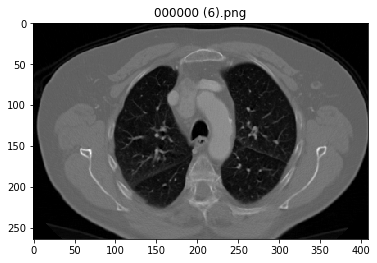

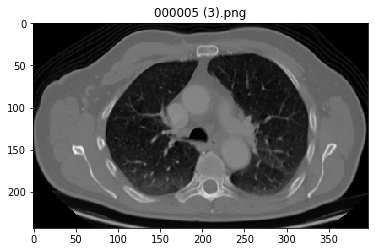

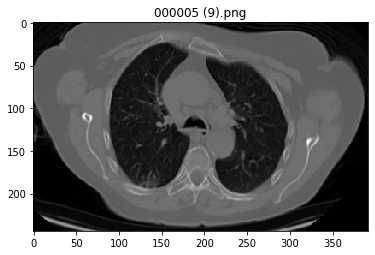

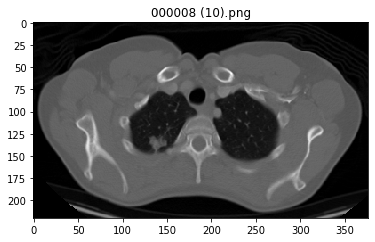

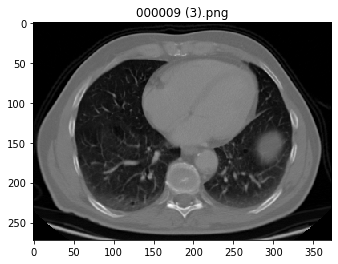

...

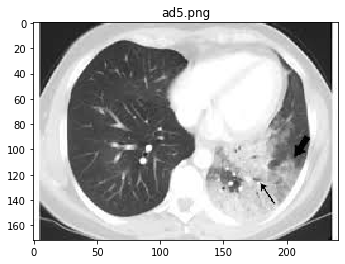

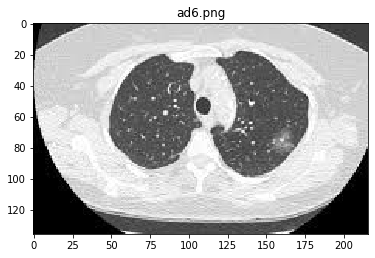

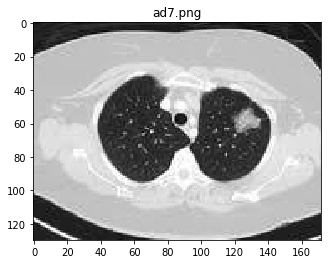

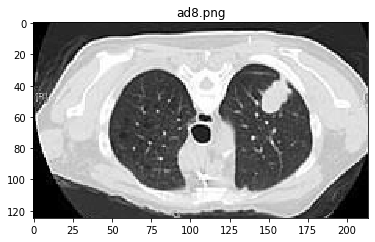

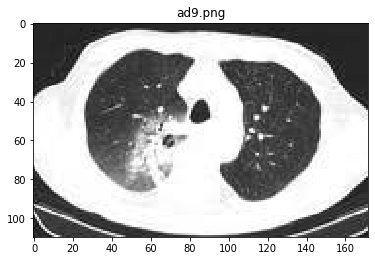

In [9]:
for img_name in (os.listdir(train_dir_path+'\\'+dir_list_2[0])):

    path = train_dir_path+'\\'+dir_list_2[0]+"\\" + img_name
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE) 
    plt.imshow(img, cmap='gray')
    plt.title(img_name)
    plt.show()

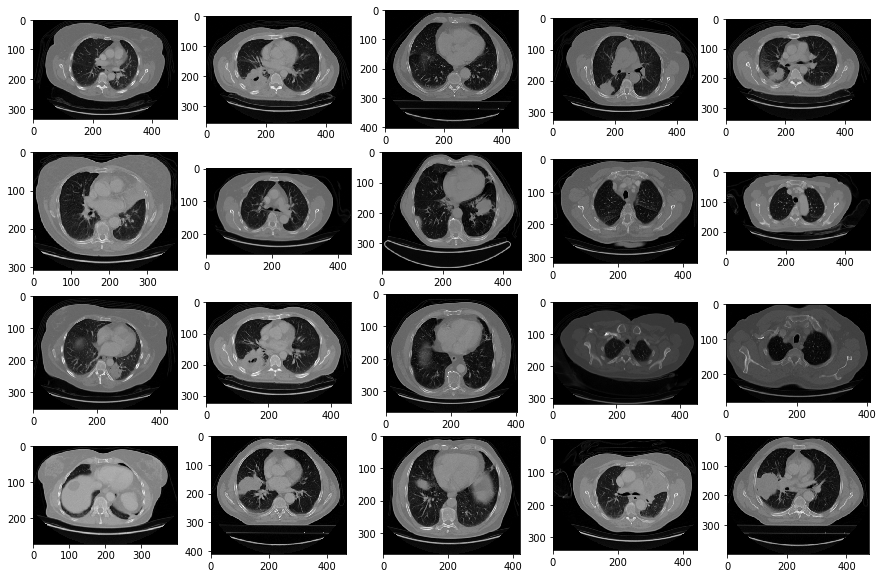

In [10]:
train_image_list = os.listdir(test_dir_path+'\\'+dir_list_2[0])

w=10
h=10
fig=plt.figure(figsize=(15 , 10))
columns = 5
rows = 4
for i in range(1, columns*rows +1):
    path = test_dir_path+'\\'+dir_list_2[0]+"\\" + train_image_list[i]
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE) 
    fig.add_subplot(rows, columns, i)
    plt.imshow(img,  cmap='gray')
plt.show()

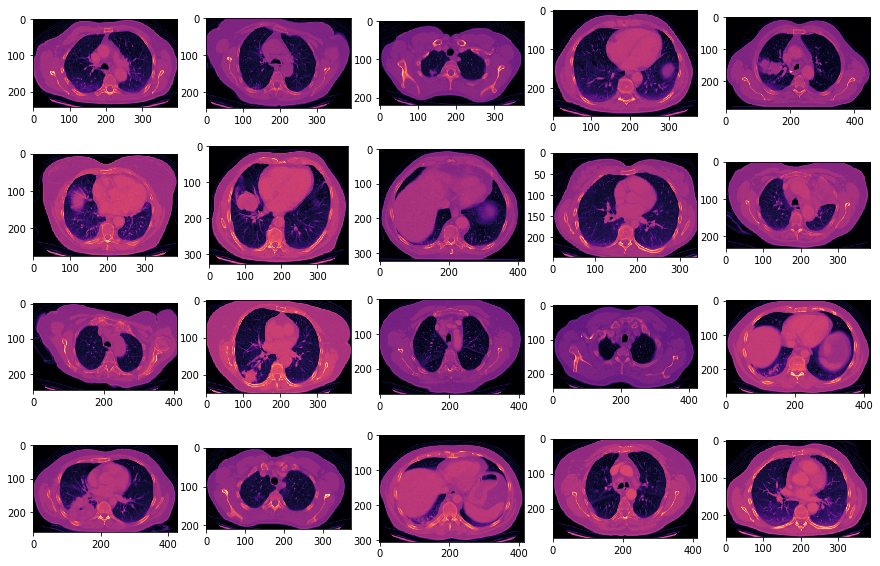

In [11]:
train_image_list = os.listdir(train_dir_path+'\\'+dir_list_2[0])

w=10
h=10
fig=plt.figure(figsize=(15 , 10))
columns = 5
rows = 4
for i in range(1, columns*rows +1):
    path = train_dir_path+'\\'+dir_list_2[0]+"\\" + train_image_list[i]
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE) 
    fig.add_subplot(rows, columns, i)
    plt.imshow(img,  cmap='magma')
plt.show()

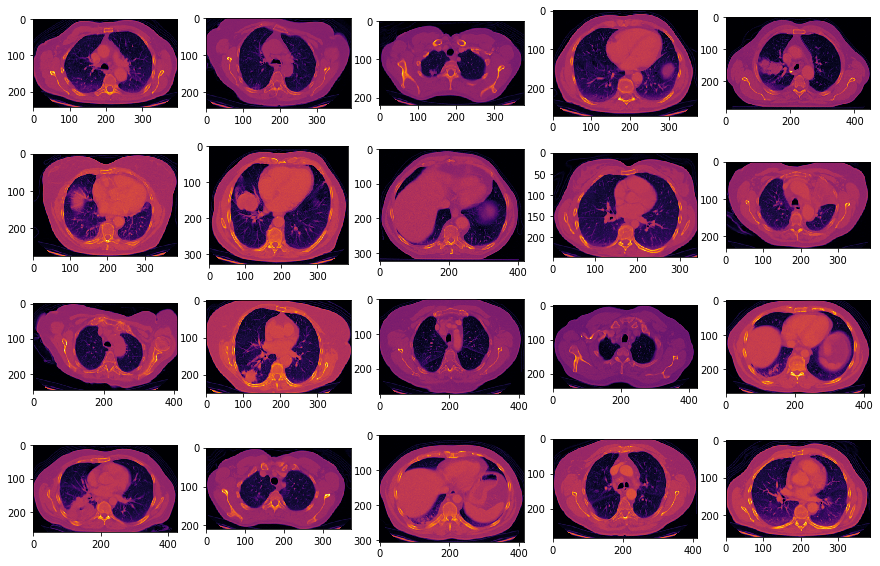

In [12]:
train_image_list = os.listdir(train_dir_path+'\\'+dir_list_2[0])

w=10
h=10
fig=plt.figure(figsize=(15 , 10))
columns = 5
rows = 4
for i in range(1, columns*rows +1):
    path = train_dir_path+'\\'+dir_list_2[0]+"\\" + train_image_list[i]
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE) 
    fig.add_subplot(rows, columns, i)
    plt.imshow(img,  cmap='inferno')
plt.show()

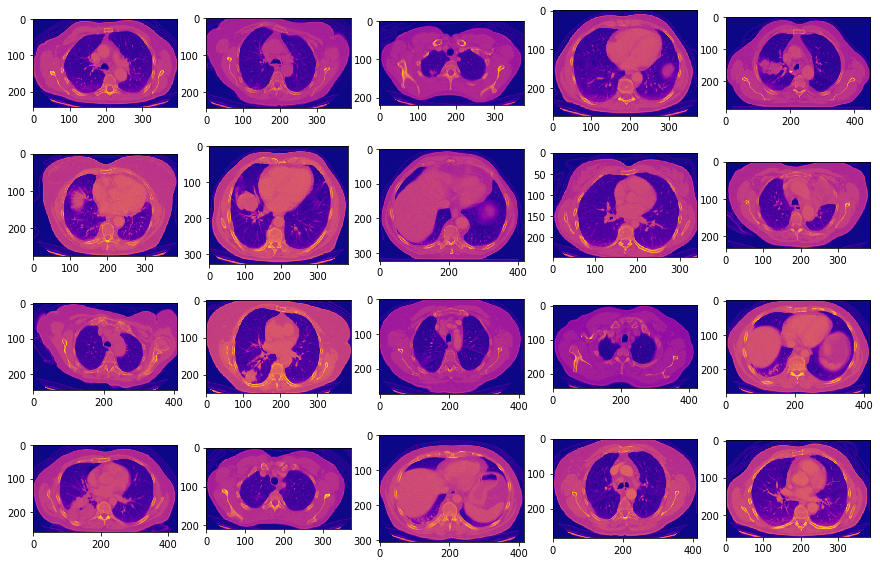

In [13]:
train_image_list = os.listdir(train_dir_path+'\\'+dir_list_2[0])

w=10
h=10
fig=plt.figure(figsize=(15 , 10))
columns = 5
rows = 4
for i in range(1, columns*rows +1):
    path = train_dir_path+'\\'+dir_list_2[0]+"\\" + train_image_list[i]
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE) 
    fig.add_subplot(rows, columns, i)
    plt.imshow(img,  cmap='plasma')
plt.show()

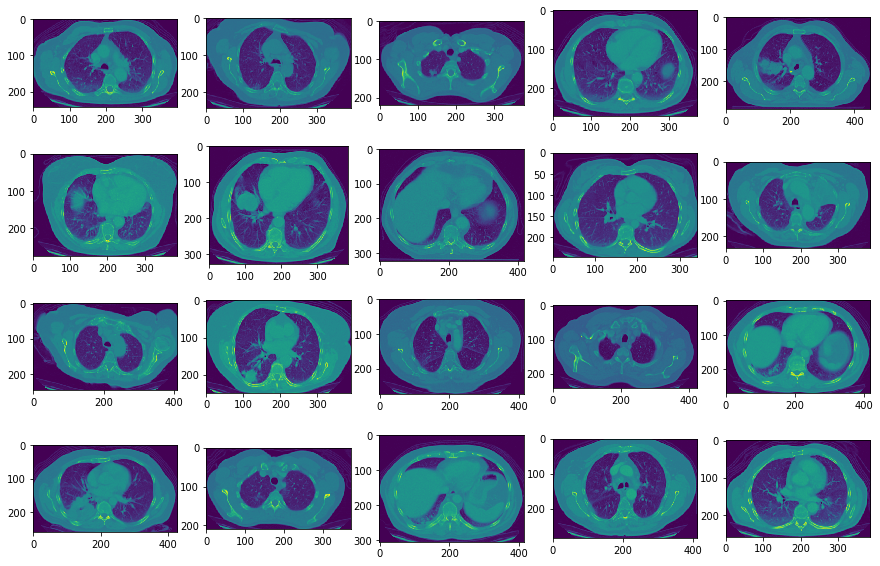

In [14]:
train_image_list = os.listdir(train_dir_path+'\\'+dir_list_2[0])

w=10
h=10
fig=plt.figure(figsize=(15 , 10))
columns = 5
rows = 4
for i in range(1, columns*rows +1):
    path = train_dir_path+'\\'+dir_list_2[0]+"\\" + train_image_list[i]
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE) 
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show()

In [15]:
image_width = 40
image_height = 30
if K.image_data_format() == 'channels_first':
    input_shape = (1,  image_height, image_width,)
else:
    input_shape = (image_height, image_width, 1)

In [16]:
train_datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        vertical_flip=True,
        fill_mode='nearest')

In [17]:
train_generator = train_datagen.flow_from_directory(
        image_dest_dir + "\\train",
        target_size=(image_height, image_width),
        batch_size=32,
        color_mode="grayscale",
        class_mode='binary',
        )

Found 343 images belonging to 2 classes.


In [18]:
class_weights = class_weight.compute_class_weight(
               'balanced',
                np.unique(train_generator.classes), 
                train_generator.classes)
for cls in train_generator.classes:
    #print(cls)
    class_weights[cls]
class_weights_1 = { 0 : class_weights[0] , 1 : class_weights[1] }

In [19]:
class_weights_1

{0: 0.8794871794871795, 1: 1.1587837837837838}

In [20]:
validation_generator = train_datagen.flow_from_directory(
        image_dest_dir + "\\valid",
        target_size=(image_height, image_width),
        batch_size=32,
        color_mode="grayscale",
        class_mode='binary',
)

Found 36 images belonging to 2 classes.


In [21]:
def sensitivity(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    return true_positives / (possible_positives + K.epsilon())

def specificity(y_true, y_pred):
    true_negatives = K.sum(K.round(K.clip((1-y_true) * (1-y_pred), 0, 1)))
    possible_negatives = K.sum(K.round(K.clip(1-y_true, 0, 1)))
    return true_negatives / (possible_negatives + K.epsilon())

def fmed(y_true, y_pred):
    spec = specificity(y_true, y_pred)
    sens = sensitivity(y_true, y_pred)
    fmed = 2 * (spec * sens)/(spec+sens+K.epsilon())
    return fmed

def f1(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

In [22]:
def macro_f1(y_true, y_pred):
     return f1_score(y_true, y_pred, average='macro')

In [23]:
def generate_model(opt=keras.optimizers.Adam()):
    model = Sequential()
    model.add(Conv2D(64, (3, 3), input_shape=input_shape))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    
    model.add(Conv2D(64, (3,3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))


    model.add(Conv2D(64, (3,3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))


    model.add(Flatten())
    model.add(Dense(64))
    model.add(Activation('relu'))
    model.add(Dropout(0.5))

    model.add(Dense(64))
    model.add(Activation('relu'))
    model.add(Dropout(0.5))

    model.add(Dense(1))
    model.add(Activation('sigmoid'))    
    
    model.compile(loss='binary_crossentropy',
              optimizer=opt,
              metrics=['accuracy', sensitivity, specificity, fmed, f1])
    return model

In [24]:
num_train_samples = 343
num_validation_samples = 36
batch_size = 32
model = generate_model(opt=keras.optimizers.Adam())
# model.load_weights(data_dir + '\\nn_best_model_cv_val_fmed.h5')

#model.load_weights(class_weights)

history_val_fmed = model.fit(
    train_generator,
    steps_per_epoch= num_train_samples // batch_size,
    validation_data=validation_generator,
    validation_steps= num_validation_samples // batch_size,
    epochs=1000, 
    verbose=1,
        callbacks=[
          #EarlyStopping(monitor='val_fmed', mode="max", verbose=1, patience=50),
          ModelCheckpoint(data_dir + '/nn_best_model_cv_val_fmed.h5', monitor='val_fmed', mode="max", verbose=1, save_best_only=True)
        ],
    class_weight = class_weights_1    
                )

Epoch 1/1000
10/10 [==============================] - 5s 387ms/step - loss: 5.7979 - accuracy: 0.4694 - sensitivity: 0.5689 - specificity: 0.3857 - fmed: 0.4155 - f1: 0.4795 - val_loss: 0.7153 - val_accuracy: 0.6562 - val_sensitivity: 0.2500 - val_specificity: 0.9000 - val_fmed: 0.3913 - val_f1: 0.3529

Epoch 00001: val_fmed improved from -inf to 0.39130, saving model to data\nn_best_model_cv_val_fmed.h5
Epoch 2/1000
10/10 [==============================] - 3s 346ms/step - loss: 1.4801 - accuracy: 0.5358 - sensitivity: 0.6390 - specificity: 0.4626 - fmed: 0.5198 - f1: 0.5354 - val_loss: 0.6905 - val_accuracy: 0.4375 - val_sensitivity: 1.0000 - val_specificity: 0.1000 - val_fmed: 0.1818 - val_f1: 0.5714

Epoch 00002: val_fmed did not improve from 0.39130
Epoch 3/1000
10/10 [==============================] - 3s 324ms/step - loss: 0.8468 - accuracy: 0.5081 - sensitivity: 0.5759 - specificity: 0.4554 - fmed: 0.4976 - f1: 0.5063 - val_loss: 0.6432 - val_accuracy: 0.5000 - val_sensitivity: 0

10/10 [==============================] - 2s 235ms/step - loss: 0.6219 - accuracy: 0.6474 - sensitivity: 0.4090 - specificity: 0.8116 - fmed: 0.5148 - f1: 0.4592 - val_loss: 0.5009 - val_accuracy: 0.8125 - val_sensitivity: 0.5000 - val_specificity: 1.0000 - val_fmed: 0.6667 - val_f1: 0.6667

Epoch 00046: val_fmed did not improve from 0.93023
Epoch 47/1000
10/10 [==============================] - 2s 241ms/step - loss: 0.5766 - accuracy: 0.7104 - sensitivity: 0.3067 - specificity: 0.9935 - fmed: 0.4582 - f1: 0.4569 - val_loss: 0.5031 - val_accuracy: 0.7812 - val_sensitivity: 0.5833 - val_specificity: 0.9000 - val_fmed: 0.7079 - val_f1: 0.6667

Epoch 00047: val_fmed did not improve from 0.93023
Epoch 48/1000
10/10 [==============================] - 2s 237ms/step - loss: 0.5916 - accuracy: 0.6828 - sensitivity: 0.4068 - specificity: 0.8533 - fmed: 0.5346 - f1: 0.4943 - val_loss: 0.4801 - val_accuracy: 0.8750 - val_sensitivity: 0.6364 - val_specificity: 1.0000 - val_fmed: 0.7778 - val_f1: 0.

10/10 [==============================] - 2s 235ms/step - loss: 0.4938 - accuracy: 0.7847 - sensitivity: 0.6146 - specificity: 0.8970 - fmed: 0.7187 - f1: 0.6894 - val_loss: 0.4197 - val_accuracy: 0.8125 - val_sensitivity: 0.5385 - val_specificity: 1.0000 - val_fmed: 0.7000 - val_f1: 0.7000

Epoch 00069: val_fmed did not improve from 0.93023
Epoch 70/1000
10/10 [==============================] - 2s 225ms/step - loss: 0.5207 - accuracy: 0.7534 - sensitivity: 0.5539 - specificity: 0.8891 - fmed: 0.6733 - f1: 0.6441 - val_loss: 0.4049 - val_accuracy: 0.9062 - val_sensitivity: 0.7500 - val_specificity: 1.0000 - val_fmed: 0.8571 - val_f1: 0.8571

Epoch 00070: val_fmed did not improve from 0.93023
Epoch 71/1000
10/10 [==============================] - 2s 247ms/step - loss: 0.5044 - accuracy: 0.7746 - sensitivity: 0.5870 - specificity: 0.9182 - fmed: 0.7092 - f1: 0.6831 - val_loss: 0.4062 - val_accuracy: 0.8438 - val_sensitivity: 0.6154 - val_specificity: 1.0000 - val_fmed: 0.7619 - val_f1: 0.


Epoch 00091: val_fmed did not improve from 0.95652
Epoch 92/1000
10/10 [==============================] - 3s 272ms/step - loss: 0.4843 - accuracy: 0.7967 - sensitivity: 0.6755 - specificity: 0.9295 - fmed: 0.7305 - f1: 0.7121 - val_loss: 0.3171 - val_accuracy: 0.9375 - val_sensitivity: 0.8182 - val_specificity: 1.0000 - val_fmed: 0.9000 - val_f1: 0.9000

Epoch 00092: val_fmed did not improve from 0.95652
Epoch 93/1000
10/10 [==============================] - 3s 318ms/step - loss: 0.4551 - accuracy: 0.8165 - sensitivity: 0.7103 - specificity: 0.9000 - fmed: 0.7831 - f1: 0.7742 - val_loss: 0.3822 - val_accuracy: 0.7500 - val_sensitivity: 0.7500 - val_specificity: 0.7500 - val_fmed: 0.7500 - val_f1: 0.6923

Epoch 00093: val_fmed did not improve from 0.95652
Epoch 94/1000
10/10 [==============================] - 2s 239ms/step - loss: 0.4485 - accuracy: 0.7988 - sensitivity: 0.7706 - specificity: 0.8198 - fmed: 0.7863 - f1: 0.7414 - val_loss: 0.2852 - val_accuracy: 0.9062 - val_sensitivity


Epoch 00114: val_fmed did not improve from 1.00000
Epoch 115/1000
10/10 [==============================] - 2s 243ms/step - loss: 0.3413 - accuracy: 0.8538 - sensitivity: 0.8331 - specificity: 0.8673 - fmed: 0.8477 - f1: 0.8158 - val_loss: 0.2020 - val_accuracy: 0.9688 - val_sensitivity: 0.9091 - val_specificity: 1.0000 - val_fmed: 0.9524 - val_f1: 0.9524

Epoch 00115: val_fmed did not improve from 1.00000
Epoch 116/1000
10/10 [==============================] - 2s 228ms/step - loss: 0.2746 - accuracy: 0.9075 - sensitivity: 0.9217 - specificity: 0.8983 - fmed: 0.9081 - f1: 0.8952 - val_loss: 0.1510 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00116: val_fmed did not improve from 1.00000
Epoch 117/1000
10/10 [==============================] - 3s 245ms/step - loss: 0.3747 - accuracy: 0.8582 - sensitivity: 0.8634 - specificity: 0.8571 - fmed: 0.8594 - f1: 0.8445 - val_loss: 0.1867 - val_accuracy: 0.9688 - val_sensitiv


Epoch 00137: val_fmed did not improve from 1.00000
Epoch 138/1000
10/10 [==============================] - 2s 224ms/step - loss: 0.2716 - accuracy: 0.8909 - sensitivity: 0.9019 - specificity: 0.8854 - fmed: 0.8872 - f1: 0.8775 - val_loss: 0.1055 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00138: val_fmed did not improve from 1.00000
Epoch 139/1000
10/10 [==============================] - 2s 228ms/step - loss: 0.2345 - accuracy: 0.9079 - sensitivity: 0.9422 - specificity: 0.8803 - fmed: 0.9084 - f1: 0.8934 - val_loss: 0.2255 - val_accuracy: 0.9375 - val_sensitivity: 0.8182 - val_specificity: 1.0000 - val_fmed: 0.9000 - val_f1: 0.9000

Epoch 00139: val_fmed did not improve from 1.00000
Epoch 140/1000
10/10 [==============================] - 2s 229ms/step - loss: 0.2676 - accuracy: 0.8801 - sensitivity: 0.8855 - specificity: 0.8736 - fmed: 0.8774 - f1: 0.8581 - val_loss: 0.1411 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00160: val_fmed did not improve from 1.00000
Epoch 161/1000
10/10 [==============================] - 2s 227ms/step - loss: 0.2058 - accuracy: 0.9168 - sensitivity: 0.9836 - specificity: 0.8618 - fmed: 0.9168 - f1: 0.9126 - val_loss: 0.1709 - val_accuracy: 0.9688 - val_sensitivity: 0.9167 - val_specificity: 1.0000 - val_fmed: 0.9565 - val_f1: 0.9565

Epoch 00161: val_fmed did not improve from 1.00000
Epoch 162/1000
10/10 [==============================] - 2s 213ms/step - loss: 0.2489 - accuracy: 0.9123 - sensitivity: 0.9011 - specificity: 0.9209 - fmed: 0.9076 - f1: 0.8912 - val_loss: 0.0852 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00162: val_fmed did not improve from 1.00000
Epoch 163/1000
10/10 [==============================] - 2s 215ms/step - loss: 0.2336 - accuracy: 0.8845 - sensitivity: 0.9238 - specificity: 0.8568 - fmed: 0.8880 - f1: 0.8817 - val_loss: 0.1052 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00183: val_fmed did not improve from 1.00000
Epoch 184/1000
10/10 [==============================] - 2s 235ms/step - loss: 0.2142 - accuracy: 0.9219 - sensitivity: 0.9798 - specificity: 0.8927 - fmed: 0.9320 - f1: 0.9060 - val_loss: 0.1427 - val_accuracy: 0.9688 - val_sensitivity: 0.9091 - val_specificity: 1.0000 - val_fmed: 0.9524 - val_f1: 0.9524

Epoch 00184: val_fmed did not improve from 1.00000
Epoch 185/1000
10/10 [==============================] - 2s 231ms/step - loss: 0.2012 - accuracy: 0.9364 - sensitivity: 0.9714 - specificity: 0.9162 - fmed: 0.9412 - f1: 0.9280 - val_loss: 0.0771 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00185: val_fmed did not improve from 1.00000
Epoch 186/1000
10/10 [==============================] - 2s 231ms/step - loss: 0.2191 - accuracy: 0.9281 - sensitivity: 0.9890 - specificity: 0.8902 - fmed: 0.9352 - f1: 0.9089 - val_loss: 0.0930 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00206: val_fmed did not improve from 1.00000
Epoch 207/1000
10/10 [==============================] - 2s 220ms/step - loss: 0.1860 - accuracy: 0.9358 - sensitivity: 0.9856 - specificity: 0.8906 - fmed: 0.9325 - f1: 0.9369 - val_loss: 0.1437 - val_accuracy: 0.9062 - val_sensitivity: 0.7000 - val_specificity: 1.0000 - val_fmed: 0.8235 - val_f1: 0.8235

Epoch 00207: val_fmed did not improve from 1.00000
Epoch 208/1000
10/10 [==============================] - 2s 232ms/step - loss: 0.2538 - accuracy: 0.9310 - sensitivity: 0.8520 - specificity: 0.9703 - fmed: 0.8994 - f1: 0.8983 - val_loss: 0.0940 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00208: val_fmed did not improve from 1.00000
Epoch 209/1000
10/10 [==============================] - 2s 222ms/step - loss: 0.2441 - accuracy: 0.9103 - sensitivity: 0.9343 - specificity: 0.8823 - fmed: 0.9044 - f1: 0.8928 - val_loss: 0.0971 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00229: val_fmed did not improve from 1.00000
Epoch 230/1000
10/10 [==============================] - 2s 238ms/step - loss: 0.1500 - accuracy: 0.9488 - sensitivity: 0.9565 - specificity: 0.9393 - fmed: 0.9455 - f1: 0.9386 - val_loss: 0.0459 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00230: val_fmed did not improve from 1.00000
Epoch 231/1000
10/10 [==============================] - 2s 231ms/step - loss: 0.1276 - accuracy: 0.9609 - sensitivity: 0.9911 - specificity: 0.9397 - fmed: 0.9638 - f1: 0.9515 - val_loss: 0.0738 - val_accuracy: 0.9688 - val_sensitivity: 0.9167 - val_specificity: 1.0000 - val_fmed: 0.9565 - val_f1: 0.9565

Epoch 00231: val_fmed did not improve from 1.00000
Epoch 232/1000
10/10 [==============================] - 2s 212ms/step - loss: 0.2055 - accuracy: 0.9274 - sensitivity: 0.9235 - specificity: 0.9343 - fmed: 0.9260 - f1: 0.9132 - val_loss: 0.0532 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00252: val_fmed did not improve from 1.00000
Epoch 253/1000
10/10 [==============================] - 2s 243ms/step - loss: 0.1499 - accuracy: 0.9410 - sensitivity: 0.9904 - specificity: 0.9024 - fmed: 0.9433 - f1: 0.9365 - val_loss: 0.0780 - val_accuracy: 0.9688 - val_sensitivity: 0.9167 - val_specificity: 1.0000 - val_fmed: 0.9565 - val_f1: 0.9565

Epoch 00253: val_fmed did not improve from 1.00000
Epoch 254/1000
10/10 [==============================] - 2s 234ms/step - loss: 0.1575 - accuracy: 0.9199 - sensitivity: 0.9910 - specificity: 0.8831 - fmed: 0.9317 - f1: 0.9006 - val_loss: 0.0525 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00254: val_fmed did not improve from 1.00000
Epoch 255/1000
10/10 [==============================] - 2s 227ms/step - loss: 0.0735 - accuracy: 0.9785 - sensitivity: 0.9985 - specificity: 0.9646 - fmed: 0.9803 - f1: 0.9771 - val_loss: 0.0525 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00275: val_fmed did not improve from 1.00000
Epoch 276/1000
10/10 [==============================] - 2s 225ms/step - loss: 0.1585 - accuracy: 0.9387 - sensitivity: 0.9714 - specificity: 0.9195 - fmed: 0.9435 - f1: 0.9292 - val_loss: 0.0587 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00276: val_fmed did not improve from 1.00000
Epoch 277/1000
10/10 [==============================] - 2s 231ms/step - loss: 0.1793 - accuracy: 0.9433 - sensitivity: 0.9521 - specificity: 0.9342 - fmed: 0.9400 - f1: 0.9381 - val_loss: 0.0817 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00277: val_fmed did not improve from 1.00000
Epoch 278/1000
10/10 [==============================] - 2s 233ms/step - loss: 0.1271 - accuracy: 0.9455 - sensitivity: 0.9581 - specificity: 0.9324 - fmed: 0.9438 - f1: 0.9354 - val_loss: 0.0732 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00298: val_fmed did not improve from 1.00000
Epoch 299/1000
10/10 [==============================] - 2s 224ms/step - loss: 0.1753 - accuracy: 0.9364 - sensitivity: 0.9650 - specificity: 0.9033 - fmed: 0.9307 - f1: 0.9313 - val_loss: 0.2265 - val_accuracy: 0.9688 - val_sensitivity: 0.9167 - val_specificity: 1.0000 - val_fmed: 0.9565 - val_f1: 0.9565

Epoch 00299: val_fmed did not improve from 1.00000
Epoch 300/1000
10/10 [==============================] - 2s 241ms/step - loss: 0.1297 - accuracy: 0.9663 - sensitivity: 0.9803 - specificity: 0.9558 - fmed: 0.9661 - f1: 0.9607 - val_loss: 0.0536 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00300: val_fmed did not improve from 1.00000
Epoch 301/1000
10/10 [==============================] - 2s 223ms/step - loss: 0.2002 - accuracy: 0.9272 - sensitivity: 0.9680 - specificity: 0.8961 - fmed: 0.9269 - f1: 0.9245 - val_loss: 0.0503 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00321: val_fmed did not improve from 1.00000
Epoch 322/1000
10/10 [==============================] - 2s 230ms/step - loss: 0.1212 - accuracy: 0.9474 - sensitivity: 0.9791 - specificity: 0.9283 - fmed: 0.9508 - f1: 0.9423 - val_loss: 0.0372 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00322: val_fmed did not improve from 1.00000
Epoch 323/1000
10/10 [==============================] - 3s 257ms/step - loss: 0.1989 - accuracy: 0.9136 - sensitivity: 0.9423 - specificity: 0.8907 - fmed: 0.9150 - f1: 0.8891 - val_loss: 0.0430 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00323: val_fmed did not improve from 1.00000
Epoch 324/1000
10/10 [==============================] - 2s 236ms/step - loss: 0.1130 - accuracy: 0.9570 - sensitivity: 0.9862 - specificity: 0.9365 - fmed: 0.9597 - f1: 0.9481 - val_loss: 0.0534 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00344: val_fmed did not improve from 1.00000
Epoch 345/1000
10/10 [==============================] - 2s 228ms/step - loss: 0.1172 - accuracy: 0.9585 - sensitivity: 0.9848 - specificity: 0.9374 - fmed: 0.9582 - f1: 0.9502 - val_loss: 0.0282 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00345: val_fmed did not improve from 1.00000
Epoch 346/1000
10/10 [==============================] - 2s 214ms/step - loss: 0.2304 - accuracy: 0.8959 - sensitivity: 0.9729 - specificity: 0.8460 - fmed: 0.9029 - f1: 0.8843 - val_loss: 0.0248 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00346: val_fmed did not improve from 1.00000
Epoch 347/1000
10/10 [==============================] - 2s 224ms/step - loss: 0.1295 - accuracy: 0.9411 - sensitivity: 1.0000 - specificity: 0.9026 - fmed: 0.9478 - f1: 0.9332 - val_loss: 0.0457 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00367: val_fmed did not improve from 1.00000
Epoch 368/1000
10/10 [==============================] - 2s 225ms/step - loss: 0.1255 - accuracy: 0.9432 - sensitivity: 1.0000 - specificity: 0.9103 - fmed: 0.9525 - f1: 0.9223 - val_loss: 0.0325 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00368: val_fmed did not improve from 1.00000
Epoch 369/1000
10/10 [==============================] - 2s 225ms/step - loss: 0.1306 - accuracy: 0.9481 - sensitivity: 0.9934 - specificity: 0.9189 - fmed: 0.9530 - f1: 0.9438 - val_loss: 0.0167 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00369: val_fmed did not improve from 1.00000
Epoch 370/1000
10/10 [==============================] - 2s 230ms/step - loss: 0.1567 - accuracy: 0.9532 - sensitivity: 1.0000 - specificity: 0.9116 - fmed: 0.9520 - f1: 0.9490 - val_loss: 0.0531 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00390: val_fmed did not improve from 1.00000
Epoch 391/1000
10/10 [==============================] - 2s 219ms/step - loss: 0.1658 - accuracy: 0.9212 - sensitivity: 0.9808 - specificity: 0.8794 - fmed: 0.9247 - f1: 0.9177 - val_loss: 0.0462 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00391: val_fmed did not improve from 1.00000
Epoch 392/1000
10/10 [==============================] - 2s 235ms/step - loss: 0.1488 - accuracy: 0.9508 - sensitivity: 0.9876 - specificity: 0.9167 - fmed: 0.9493 - f1: 0.9482 - val_loss: 0.0562 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00392: val_fmed did not improve from 1.00000
Epoch 393/1000
10/10 [==============================] - 2s 233ms/step - loss: 0.1796 - accuracy: 0.9397 - sensitivity: 0.9696 - specificity: 0.9137 - fmed: 0.9389 - f1: 0.9349 - val_loss: 0.0527 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00413: val_fmed did not improve from 1.00000
Epoch 414/1000
10/10 [==============================] - 3s 262ms/step - loss: 0.2034 - accuracy: 0.9102 - sensitivity: 0.9989 - specificity: 0.8509 - fmed: 0.9164 - f1: 0.8997 - val_loss: 0.0729 - val_accuracy: 0.9688 - val_sensitivity: 0.9000 - val_specificity: 1.0000 - val_fmed: 0.9474 - val_f1: 0.9474

Epoch 00414: val_fmed did not improve from 1.00000
Epoch 415/1000
10/10 [==============================] - 2s 238ms/step - loss: 0.1359 - accuracy: 0.9399 - sensitivity: 0.9489 - specificity: 0.9151 - fmed: 0.9253 - f1: 0.9304 - val_loss: 0.0441 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00415: val_fmed did not improve from 1.00000
Epoch 416/1000
10/10 [==============================] - 2s 223ms/step - loss: 0.1132 - accuracy: 0.9493 - sensitivity: 0.9823 - specificity: 0.9249 - fmed: 0.9521 - f1: 0.9412 - val_loss: 0.0502 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00436: val_fmed did not improve from 1.00000
Epoch 437/1000
10/10 [==============================] - 2s 245ms/step - loss: 0.1393 - accuracy: 0.9501 - sensitivity: 0.9855 - specificity: 0.9189 - fmed: 0.9470 - f1: 0.9529 - val_loss: 0.0748 - val_accuracy: 0.9688 - val_sensitivity: 0.9231 - val_specificity: 1.0000 - val_fmed: 0.9600 - val_f1: 0.9600

Epoch 00437: val_fmed did not improve from 1.00000
Epoch 438/1000
10/10 [==============================] - 3s 242ms/step - loss: 0.1163 - accuracy: 0.9641 - sensitivity: 0.9718 - specificity: 0.9576 - fmed: 0.9627 - f1: 0.9501 - val_loss: 0.1914 - val_accuracy: 0.9375 - val_sensitivity: 0.8182 - val_specificity: 1.0000 - val_fmed: 0.9000 - val_f1: 0.9000

Epoch 00438: val_fmed did not improve from 1.00000
Epoch 439/1000
10/10 [==============================] - 2s 218ms/step - loss: 0.0790 - accuracy: 0.9680 - sensitivity: 0.9541 - specificity: 0.9648 - fmed: 0.9582 - f1: 0.9413 - val_loss: 0.0461 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00459: val_fmed did not improve from 1.00000
Epoch 460/1000
10/10 [==============================] - 3s 291ms/step - loss: 0.1073 - accuracy: 0.9347 - sensitivity: 0.9905 - specificity: 0.8982 - fmed: 0.9417 - f1: 0.9250 - val_loss: 0.0170 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00460: val_fmed did not improve from 1.00000
Epoch 461/1000
10/10 [==============================] - 4s 366ms/step - loss: 0.1101 - accuracy: 0.9541 - sensitivity: 0.9914 - specificity: 0.9221 - fmed: 0.9541 - f1: 0.9484 - val_loss: 0.0462 - val_accuracy: 0.9688 - val_sensitivity: 0.9091 - val_specificity: 1.0000 - val_fmed: 0.9524 - val_f1: 0.9524

Epoch 00461: val_fmed did not improve from 1.00000
Epoch 462/1000
10/10 [==============================] - 3s 280ms/step - loss: 0.0946 - accuracy: 0.9609 - sensitivity: 0.9828 - specificity: 0.9377 - fmed: 0.9576 - f1: 0.9532 - val_loss: 0.0475 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00482: val_fmed did not improve from 1.00000
Epoch 483/1000
10/10 [==============================] - 2s 225ms/step - loss: 0.1381 - accuracy: 0.9417 - sensitivity: 0.9970 - specificity: 0.9032 - fmed: 0.9455 - f1: 0.9360 - val_loss: 0.0680 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00483: val_fmed did not improve from 1.00000
Epoch 484/1000
10/10 [==============================] - 3s 265ms/step - loss: 0.1695 - accuracy: 0.9283 - sensitivity: 0.9610 - specificity: 0.9031 - fmed: 0.9295 - f1: 0.9179 - val_loss: 0.0366 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00484: val_fmed did not improve from 1.00000
Epoch 485/1000
10/10 [==============================] - 2s 231ms/step - loss: 0.1155 - accuracy: 0.9517 - sensitivity: 0.9888 - specificity: 0.9275 - fmed: 0.9566 - f1: 0.9427 - val_loss: 0.0694 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00505: val_fmed did not improve from 1.00000
Epoch 506/1000
10/10 [==============================] - 2s 237ms/step - loss: 0.0911 - accuracy: 0.9617 - sensitivity: 1.0000 - specificity: 0.9331 - fmed: 0.9650 - f1: 0.9592 - val_loss: 0.0703 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00506: val_fmed did not improve from 1.00000
Epoch 507/1000
10/10 [==============================] - 2s 236ms/step - loss: 0.0696 - accuracy: 0.9747 - sensitivity: 0.9674 - specificity: 0.9750 - fmed: 0.9706 - f1: 0.9637 - val_loss: 0.0507 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00507: val_fmed did not improve from 1.00000
Epoch 508/1000
10/10 [==============================] - 2s 241ms/step - loss: 0.1833 - accuracy: 0.9442 - sensitivity: 1.0000 - specificity: 0.8955 - fmed: 0.9421 - f1: 0.9386 - val_loss: 0.0714 - val_accuracy: 0.9688 - val_sensitiv


Epoch 00528: val_fmed did not improve from 1.00000
Epoch 529/1000
10/10 [==============================] - 2s 215ms/step - loss: 0.1028 - accuracy: 0.9476 - sensitivity: 1.0000 - specificity: 0.9075 - fmed: 0.9511 - f1: 0.9361 - val_loss: 0.0391 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00529: val_fmed did not improve from 1.00000
Epoch 530/1000
10/10 [==============================] - 2s 225ms/step - loss: 0.0923 - accuracy: 0.9674 - sensitivity: 0.9893 - specificity: 0.9496 - fmed: 0.9679 - f1: 0.9630 - val_loss: 0.0185 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00530: val_fmed did not improve from 1.00000
Epoch 531/1000
10/10 [==============================] - 2s 215ms/step - loss: 0.0937 - accuracy: 0.9525 - sensitivity: 0.9884 - specificity: 0.9223 - fmed: 0.9534 - f1: 0.9461 - val_loss: 0.0408 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00551: val_fmed did not improve from 1.00000
Epoch 552/1000
10/10 [==============================] - 2s 243ms/step - loss: 0.0893 - accuracy: 0.9709 - sensitivity: 0.9774 - specificity: 0.9610 - fmed: 0.9683 - f1: 0.9619 - val_loss: 0.0162 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00552: val_fmed did not improve from 1.00000
Epoch 553/1000
10/10 [==============================] - 2s 226ms/step - loss: 0.1148 - accuracy: 0.9410 - sensitivity: 0.9915 - specificity: 0.9046 - fmed: 0.9450 - f1: 0.9342 - val_loss: 0.0286 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00553: val_fmed did not improve from 1.00000
Epoch 554/1000
10/10 [==============================] - 2s 227ms/step - loss: 0.1086 - accuracy: 0.9499 - sensitivity: 0.9898 - specificity: 0.9190 - fmed: 0.9524 - f1: 0.9425 - val_loss: 0.0399 - val_accuracy: 0.9688 - val_sensitiv


Epoch 00574: val_fmed did not improve from 1.00000
Epoch 575/1000
10/10 [==============================] - 2s 238ms/step - loss: 0.1582 - accuracy: 0.9428 - sensitivity: 0.9863 - specificity: 0.9131 - fmed: 0.9465 - f1: 0.9336 - val_loss: 0.0063 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00575: val_fmed did not improve from 1.00000
Epoch 576/1000
10/10 [==============================] - 2s 227ms/step - loss: 0.1895 - accuracy: 0.9381 - sensitivity: 0.9940 - specificity: 0.8989 - fmed: 0.9429 - f1: 0.9302 - val_loss: 0.0796 - val_accuracy: 0.9688 - val_sensitivity: 0.9000 - val_specificity: 1.0000 - val_fmed: 0.9474 - val_f1: 0.9474

Epoch 00576: val_fmed did not improve from 1.00000
Epoch 577/1000
10/10 [==============================] - 3s 238ms/step - loss: 0.1344 - accuracy: 0.9380 - sensitivity: 0.9588 - specificity: 0.9231 - fmed: 0.9400 - f1: 0.9339 - val_loss: 0.0539 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00597: val_fmed did not improve from 1.00000
Epoch 598/1000
10/10 [==============================] - 2s 220ms/step - loss: 0.1016 - accuracy: 0.9446 - sensitivity: 0.9880 - specificity: 0.9043 - fmed: 0.9390 - f1: 0.9422 - val_loss: 0.0055 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00598: val_fmed did not improve from 1.00000
Epoch 599/1000
10/10 [==============================] - 2s 238ms/step - loss: 0.0746 - accuracy: 0.9593 - sensitivity: 0.9789 - specificity: 0.9437 - fmed: 0.9607 - f1: 0.9551 - val_loss: 0.0475 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00599: val_fmed did not improve from 1.00000
Epoch 600/1000
10/10 [==============================] - 3s 263ms/step - loss: 0.0728 - accuracy: 0.9603 - sensitivity: 0.9884 - specificity: 0.9367 - fmed: 0.9611 - f1: 0.9550 - val_loss: 0.0077 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00620: val_fmed did not improve from 1.00000
Epoch 621/1000
10/10 [==============================] - 2s 237ms/step - loss: 0.1250 - accuracy: 0.9622 - sensitivity: 0.9918 - specificity: 0.9350 - fmed: 0.9612 - f1: 0.9644 - val_loss: 0.0088 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00621: val_fmed did not improve from 1.00000
Epoch 622/1000
10/10 [==============================] - 2s 228ms/step - loss: 0.1298 - accuracy: 0.9310 - sensitivity: 0.9442 - specificity: 0.9206 - fmed: 0.9272 - f1: 0.9267 - val_loss: 0.0367 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00622: val_fmed did not improve from 1.00000
Epoch 623/1000
10/10 [==============================] - 2s 236ms/step - loss: 0.1127 - accuracy: 0.9472 - sensitivity: 0.9946 - specificity: 0.9145 - fmed: 0.9517 - f1: 0.9345 - val_loss: 0.1511 - val_accuracy: 0.9375 - val_sensitiv


Epoch 00643: val_fmed did not improve from 1.00000
Epoch 644/1000
10/10 [==============================] - 2s 221ms/step - loss: 0.1077 - accuracy: 0.9649 - sensitivity: 0.9986 - specificity: 0.9418 - fmed: 0.9691 - f1: 0.9594 - val_loss: 0.0385 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00644: val_fmed did not improve from 1.00000
Epoch 645/1000
10/10 [==============================] - 2s 224ms/step - loss: 0.0621 - accuracy: 0.9707 - sensitivity: 1.0000 - specificity: 0.9479 - fmed: 0.9728 - f1: 0.9670 - val_loss: 0.0423 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00645: val_fmed did not improve from 1.00000
Epoch 646/1000
10/10 [==============================] - 2s 208ms/step - loss: 0.1217 - accuracy: 0.9506 - sensitivity: 0.9485 - specificity: 0.9525 - fmed: 0.9480 - f1: 0.9400 - val_loss: 0.0682 - val_accuracy: 0.9688 - val_sensitiv


Epoch 00666: val_fmed did not improve from 1.00000
Epoch 667/1000
10/10 [==============================] - 2s 234ms/step - loss: 0.0803 - accuracy: 0.9657 - sensitivity: 0.9910 - specificity: 0.9458 - fmed: 0.9671 - f1: 0.9610 - val_loss: 0.0319 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00667: val_fmed did not improve from 1.00000
Epoch 668/1000
10/10 [==============================] - 2s 228ms/step - loss: 0.0864 - accuracy: 0.9587 - sensitivity: 0.9797 - specificity: 0.9395 - fmed: 0.9586 - f1: 0.9522 - val_loss: 0.0516 - val_accuracy: 0.9688 - val_sensitivity: 0.9167 - val_specificity: 1.0000 - val_fmed: 0.9565 - val_f1: 0.9565

Epoch 00668: val_fmed did not improve from 1.00000
Epoch 669/1000
10/10 [==============================] - 2s 217ms/step - loss: 0.1421 - accuracy: 0.9398 - sensitivity: 0.9693 - specificity: 0.9124 - fmed: 0.9391 - f1: 0.9317 - val_loss: 0.0204 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00689: val_fmed did not improve from 1.00000
Epoch 690/1000
10/10 [==============================] - 2s 246ms/step - loss: 0.0854 - accuracy: 0.9790 - sensitivity: 0.9741 - specificity: 0.9852 - fmed: 0.9791 - f1: 0.9791 - val_loss: 0.0625 - val_accuracy: 0.9688 - val_sensitivity: 0.9167 - val_specificity: 1.0000 - val_fmed: 0.9565 - val_f1: 0.9565

Epoch 00690: val_fmed did not improve from 1.00000
Epoch 691/1000
10/10 [==============================] - 2s 226ms/step - loss: 0.1002 - accuracy: 0.9482 - sensitivity: 0.9546 - specificity: 0.9394 - fmed: 0.9460 - f1: 0.9391 - val_loss: 0.0144 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00691: val_fmed did not improve from 1.00000
Epoch 692/1000
10/10 [==============================] - 2s 232ms/step - loss: 0.0857 - accuracy: 0.9474 - sensitivity: 0.9655 - specificity: 0.9411 - fmed: 0.9515 - f1: 0.9422 - val_loss: 0.0743 - val_accuracy: 0.9688 - val_sensitiv


Epoch 00712: val_fmed did not improve from 1.00000
Epoch 713/1000
10/10 [==============================] - 2s 223ms/step - loss: 0.1602 - accuracy: 0.9302 - sensitivity: 0.9642 - specificity: 0.9020 - fmed: 0.9305 - f1: 0.9206 - val_loss: 0.0567 - val_accuracy: 0.9375 - val_sensitivity: 0.8000 - val_specificity: 1.0000 - val_fmed: 0.8889 - val_f1: 0.8889

Epoch 00713: val_fmed did not improve from 1.00000
Epoch 714/1000
10/10 [==============================] - 2s 239ms/step - loss: 0.0942 - accuracy: 0.9706 - sensitivity: 0.9898 - specificity: 0.9600 - fmed: 0.9738 - f1: 0.9652 - val_loss: 0.0677 - val_accuracy: 0.9375 - val_sensitivity: 0.8333 - val_specificity: 1.0000 - val_fmed: 0.9091 - val_f1: 0.9091

Epoch 00714: val_fmed did not improve from 1.00000
Epoch 715/1000
10/10 [==============================] - 3s 251ms/step - loss: 0.1106 - accuracy: 0.9596 - sensitivity: 0.9960 - specificity: 0.9239 - fmed: 0.9576 - f1: 0.9586 - val_loss: 0.0563 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00735: val_fmed did not improve from 1.00000
Epoch 736/1000
10/10 [==============================] - 3s 290ms/step - loss: 0.0932 - accuracy: 0.9557 - sensitivity: 1.0000 - specificity: 0.9139 - fmed: 0.9540 - f1: 0.9558 - val_loss: 0.0435 - val_accuracy: 0.9688 - val_sensitivity: 1.0000 - val_specificity: 0.9545 - val_fmed: 0.9767 - val_f1: 0.9524

Epoch 00736: val_fmed did not improve from 1.00000
Epoch 737/1000
10/10 [==============================] - 3s 297ms/step - loss: 0.0746 - accuracy: 0.9727 - sensitivity: 0.9962 - specificity: 0.9624 - fmed: 0.9776 - f1: 0.9677 - val_loss: 0.0361 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00737: val_fmed did not improve from 1.00000
Epoch 738/1000
10/10 [==============================] - 2s 233ms/step - loss: 0.1124 - accuracy: 0.9498 - sensitivity: 0.9901 - specificity: 0.9116 - fmed: 0.9486 - f1: 0.9470 - val_loss: 0.0189 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00758: val_fmed did not improve from 1.00000
Epoch 759/1000
10/10 [==============================] - 2s 232ms/step - loss: 0.1012 - accuracy: 0.9483 - sensitivity: 0.9533 - specificity: 0.9466 - fmed: 0.9495 - f1: 0.9426 - val_loss: 0.0190 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00759: val_fmed did not improve from 1.00000
Epoch 760/1000
10/10 [==============================] - 2s 239ms/step - loss: 0.0831 - accuracy: 0.9671 - sensitivity: 1.0000 - specificity: 0.9397 - fmed: 0.9685 - f1: 0.9634 - val_loss: 0.0525 - val_accuracy: 0.9375 - val_sensitivity: 0.8333 - val_specificity: 1.0000 - val_fmed: 0.9091 - val_f1: 0.9091

Epoch 00760: val_fmed did not improve from 1.00000
Epoch 761/1000
10/10 [==============================] - 2s 224ms/step - loss: 0.0894 - accuracy: 0.9560 - sensitivity: 0.9413 - specificity: 0.9587 - fmed: 0.9476 - f1: 0.9492 - val_loss: 0.0567 - val_accuracy: 0.9688 - val_sensitiv


Epoch 00781: val_fmed did not improve from 1.00000
Epoch 782/1000
10/10 [==============================] - 3s 268ms/step - loss: 0.0967 - accuracy: 0.9566 - sensitivity: 0.9829 - specificity: 0.9342 - fmed: 0.9567 - f1: 0.9515 - val_loss: 0.0222 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00782: val_fmed did not improve from 1.00000
Epoch 783/1000
10/10 [==============================] - 3s 310ms/step - loss: 0.1166 - accuracy: 0.9638 - sensitivity: 0.9828 - specificity: 0.9520 - fmed: 0.9665 - f1: 0.9629 - val_loss: 0.0493 - val_accuracy: 0.9688 - val_sensitivity: 0.9091 - val_specificity: 1.0000 - val_fmed: 0.9524 - val_f1: 0.9524

Epoch 00783: val_fmed did not improve from 1.00000
Epoch 784/1000
10/10 [==============================] - 2s 242ms/step - loss: 0.2044 - accuracy: 0.9479 - sensitivity: 0.9582 - specificity: 0.9529 - fmed: 0.9529 - f1: 0.9337 - val_loss: 0.0104 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00804: val_fmed did not improve from 1.00000
Epoch 805/1000
10/10 [==============================] - 3s 259ms/step - loss: 0.0709 - accuracy: 0.9801 - sensitivity: 0.9914 - specificity: 0.9747 - fmed: 0.9829 - f1: 0.9737 - val_loss: 0.0417 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00805: val_fmed did not improve from 1.00000
Epoch 806/1000
10/10 [==============================] - 2s 249ms/step - loss: 0.0921 - accuracy: 0.9627 - sensitivity: 1.0000 - specificity: 0.9326 - fmed: 0.9637 - f1: 0.9623 - val_loss: 0.0489 - val_accuracy: 0.9688 - val_sensitivity: 0.9167 - val_specificity: 1.0000 - val_fmed: 0.9565 - val_f1: 0.9565

Epoch 00806: val_fmed did not improve from 1.00000
Epoch 807/1000
10/10 [==============================] - 2s 244ms/step - loss: 0.0787 - accuracy: 0.9632 - sensitivity: 0.9885 - specificity: 0.9512 - fmed: 0.9688 - f1: 0.9546 - val_loss: 0.0275 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00827: val_fmed did not improve from 1.00000
Epoch 828/1000
10/10 [==============================] - 2s 233ms/step - loss: 0.0679 - accuracy: 0.9799 - sensitivity: 0.9814 - specificity: 0.9743 - fmed: 0.9766 - f1: 0.9739 - val_loss: 0.0025 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00828: val_fmed did not improve from 1.00000
Epoch 829/1000
10/10 [==============================] - 2s 228ms/step - loss: 0.1210 - accuracy: 0.9328 - sensitivity: 1.0000 - specificity: 0.8788 - fmed: 0.9280 - f1: 0.9387 - val_loss: 0.0862 - val_accuracy: 0.9375 - val_sensitivity: 0.8333 - val_specificity: 1.0000 - val_fmed: 0.9091 - val_f1: 0.9091

Epoch 00829: val_fmed did not improve from 1.00000
Epoch 830/1000
10/10 [==============================] - 2s 234ms/step - loss: 0.0830 - accuracy: 0.9652 - sensitivity: 0.9803 - specificity: 0.9500 - fmed: 0.9638 - f1: 0.9638 - val_loss: 0.0120 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00850: val_fmed did not improve from 1.00000
Epoch 851/1000
10/10 [==============================] - 2s 246ms/step - loss: 0.0771 - accuracy: 0.9600 - sensitivity: 0.9593 - specificity: 0.9607 - fmed: 0.9596 - f1: 0.9406 - val_loss: 0.0063 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00851: val_fmed did not improve from 1.00000
Epoch 852/1000
10/10 [==============================] - 3s 249ms/step - loss: 0.0879 - accuracy: 0.9542 - sensitivity: 0.9925 - specificity: 0.9225 - fmed: 0.9555 - f1: 0.9429 - val_loss: 0.0014 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00852: val_fmed did not improve from 1.00000
Epoch 853/1000
10/10 [==============================] - 3s 256ms/step - loss: 0.0373 - accuracy: 0.9860 - sensitivity: 0.9873 - specificity: 0.9876 - fmed: 0.9872 - f1: 0.9830 - val_loss: 0.0063 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00873: val_fmed did not improve from 1.00000
Epoch 874/1000
10/10 [==============================] - 3s 252ms/step - loss: 0.0948 - accuracy: 0.9635 - sensitivity: 1.0000 - specificity: 0.9345 - fmed: 0.9652 - f1: 0.9594 - val_loss: 0.0403 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00874: val_fmed did not improve from 1.00000
Epoch 875/1000
10/10 [==============================] - 2s 239ms/step - loss: 0.0977 - accuracy: 0.9644 - sensitivity: 0.9791 - specificity: 0.9596 - fmed: 0.9685 - f1: 0.9519 - val_loss: 0.0342 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00875: val_fmed did not improve from 1.00000
Epoch 876/1000
10/10 [==============================] - 2s 220ms/step - loss: 0.0758 - accuracy: 0.9575 - sensitivity: 0.9978 - specificity: 0.9214 - fmed: 0.9561 - f1: 0.9573 - val_loss: 0.0505 - val_accuracy: 0.9688 - val_sensitiv


Epoch 00896: val_fmed did not improve from 1.00000
Epoch 897/1000
10/10 [==============================] - 2s 230ms/step - loss: 0.0681 - accuracy: 0.9770 - sensitivity: 0.9981 - specificity: 0.9614 - fmed: 0.9784 - f1: 0.9752 - val_loss: 0.0130 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00897: val_fmed did not improve from 1.00000
Epoch 898/1000
10/10 [==============================] - 2s 245ms/step - loss: 0.0527 - accuracy: 0.9748 - sensitivity: 0.9828 - specificity: 0.9729 - fmed: 0.9771 - f1: 0.9739 - val_loss: 0.0206 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00898: val_fmed did not improve from 1.00000
Epoch 899/1000
10/10 [==============================] - 2s 229ms/step - loss: 0.0869 - accuracy: 0.9747 - sensitivity: 0.9926 - specificity: 0.9601 - fmed: 0.9758 - f1: 0.9689 - val_loss: 0.0273 - val_accuracy: 1.0000 - val_sensitiv


Epoch 00919: val_fmed did not improve from 1.00000
Epoch 920/1000
10/10 [==============================] - 2s 229ms/step - loss: 0.0909 - accuracy: 0.9607 - sensitivity: 0.9773 - specificity: 0.9482 - fmed: 0.9607 - f1: 0.9524 - val_loss: 0.0955 - val_accuracy: 0.9062 - val_sensitivity: 0.7500 - val_specificity: 1.0000 - val_fmed: 0.8571 - val_f1: 0.8571

Epoch 00920: val_fmed did not improve from 1.00000
Epoch 921/1000
10/10 [==============================] - 2s 218ms/step - loss: 0.0597 - accuracy: 0.9781 - sensitivity: 0.9832 - specificity: 0.9707 - fmed: 0.9756 - f1: 0.9765 - val_loss: 0.0362 - val_accuracy: 0.9688 - val_sensitivity: 0.9091 - val_specificity: 1.0000 - val_fmed: 0.9524 - val_f1: 0.9524

Epoch 00921: val_fmed did not improve from 1.00000
Epoch 922/1000
10/10 [==============================] - 2s 227ms/step - loss: 0.0801 - accuracy: 0.9711 - sensitivity: 0.9766 - specificity: 0.9692 - fmed: 0.9720 - f1: 0.9655 - val_loss: 0.0740 - val_accuracy: 0.9375 - val_sensitiv


Epoch 00942: val_fmed did not improve from 1.00000
Epoch 943/1000
10/10 [==============================] - 2s 229ms/step - loss: 0.0844 - accuracy: 0.9641 - sensitivity: 0.9862 - specificity: 0.9432 - fmed: 0.9631 - f1: 0.9537 - val_loss: 0.0391 - val_accuracy: 0.9688 - val_sensitivity: 0.9231 - val_specificity: 1.0000 - val_fmed: 0.9600 - val_f1: 0.9600

Epoch 00943: val_fmed did not improve from 1.00000
Epoch 944/1000
10/10 [==============================] - 2s 223ms/step - loss: 0.0872 - accuracy: 0.9660 - sensitivity: 0.9832 - specificity: 0.9545 - fmed: 0.9676 - f1: 0.9595 - val_loss: 0.0497 - val_accuracy: 0.9688 - val_sensitivity: 0.9091 - val_specificity: 1.0000 - val_fmed: 0.9524 - val_f1: 0.9524

Epoch 00944: val_fmed did not improve from 1.00000
Epoch 945/1000
10/10 [==============================] - 2s 209ms/step - loss: 0.0458 - accuracy: 0.9853 - sensitivity: 0.9941 - specificity: 0.9796 - fmed: 0.9865 - f1: 0.9833 - val_loss: 0.1088 - val_accuracy: 0.9688 - val_sensitiv


Epoch 00965: val_fmed did not improve from 1.00000
Epoch 966/1000
10/10 [==============================] - 3s 264ms/step - loss: 0.0636 - accuracy: 0.9655 - sensitivity: 0.9884 - specificity: 0.9475 - fmed: 0.9664 - f1: 0.9597 - val_loss: 0.0107 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00966: val_fmed did not improve from 1.00000
Epoch 967/1000
10/10 [==============================] - 2s 230ms/step - loss: 0.0556 - accuracy: 0.9724 - sensitivity: 0.9592 - specificity: 0.9776 - fmed: 0.9680 - f1: 0.9672 - val_loss: 0.0306 - val_accuracy: 0.9688 - val_sensitivity: 0.9231 - val_specificity: 1.0000 - val_fmed: 0.9600 - val_f1: 0.9600

Epoch 00967: val_fmed did not improve from 1.00000
Epoch 968/1000
10/10 [==============================] - 3s 260ms/step - loss: 0.0390 - accuracy: 0.9859 - sensitivity: 1.0000 - specificity: 0.9747 - fmed: 0.9869 - f1: 0.9839 - val_loss: 0.0795 - val_accuracy: 0.9688 - val_sensitiv


Epoch 00988: val_fmed did not improve from 1.00000
Epoch 989/1000
10/10 [==============================] - 2s 225ms/step - loss: 0.0508 - accuracy: 0.9805 - sensitivity: 0.9675 - specificity: 0.9912 - fmed: 0.9784 - f1: 0.9759 - val_loss: 0.0257 - val_accuracy: 1.0000 - val_sensitivity: 1.0000 - val_specificity: 1.0000 - val_fmed: 1.0000 - val_f1: 1.0000

Epoch 00989: val_fmed did not improve from 1.00000
Epoch 990/1000
10/10 [==============================] - 2s 231ms/step - loss: 0.0644 - accuracy: 0.9598 - sensitivity: 0.9891 - specificity: 0.9411 - fmed: 0.9640 - f1: 0.9512 - val_loss: 0.2322 - val_accuracy: 0.9375 - val_sensitivity: 0.8182 - val_specificity: 1.0000 - val_fmed: 0.9000 - val_f1: 0.9000

Epoch 00990: val_fmed did not improve from 1.00000
Epoch 991/1000
10/10 [==============================] - 2s 256ms/step - loss: 0.0543 - accuracy: 0.9881 - sensitivity: 1.0000 - specificity: 0.9788 - fmed: 0.9889 - f1: 0.9839 - val_loss: 0.0316 - val_accuracy: 1.0000 - val_sensitiv

dict_keys(['loss', 'accuracy', 'sensitivity', 'specificity', 'fmed', 'f1', 'val_loss', 'val_accuracy', 'val_sensitivity', 'val_specificity', 'val_fmed', 'val_f1'])


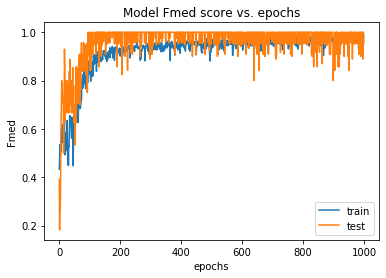

In [25]:
# list all data in history
history = history_val_fmed
print(history.history.keys())

# summarize history for fmed score
plt.plot(history.history['fmed'])
plt.plot(history.history['val_fmed'])
plt.title('Model Fmed score vs. epochs')
plt.ylabel('Fmed')
plt.xlabel('epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()

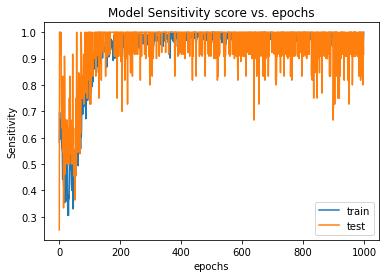

In [26]:
# summarize history for sensitivity score
plt.plot(history.history['sensitivity'])
plt.plot(history.history['val_sensitivity'])
plt.title('Model Sensitivity score vs. epochs')
plt.ylabel('Sensitivity')
plt.xlabel('epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()



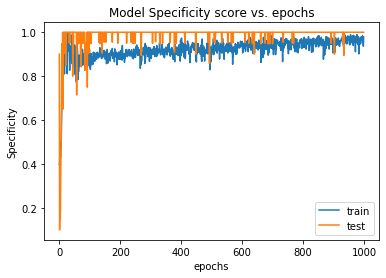

In [27]:
# summarize history for specificity score
plt.plot(history.history['specificity'])
plt.plot(history.history['val_specificity'])
plt.title('Model Specificity score vs. epochs')
plt.ylabel('Specificity')
plt.xlabel('epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()



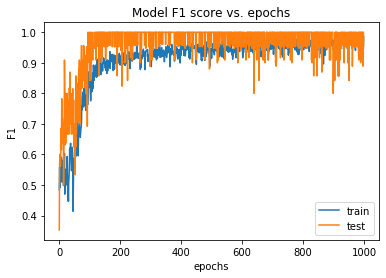

In [28]:
# summarize history for f1 score
plt.plot(history.history['f1'])
plt.plot(history.history['val_f1'])
plt.title('Model F1 score vs. epochs')
plt.ylabel('F1')
plt.xlabel('epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()



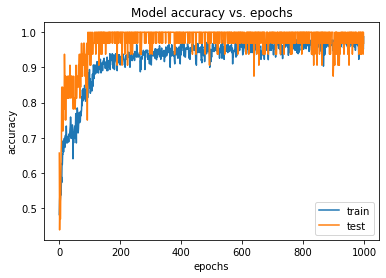

In [29]:
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy vs. epochs')
plt.ylabel('accuracy')
plt.xlabel('epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()



In [30]:
test_generator = train_datagen.flow_from_directory(
        image_dest_dir + "/test",
        target_size=(image_height, image_width),
        batch_size=32,
        color_mode="grayscale",
        class_mode='binary',
        shuffle=False,
        seed=42
)

Found 174 images belonging to 2 classes.


In [31]:
model = generate_model()

In [32]:
model.load_weights(data_dir + '\\nn_best_model_cv_val_fmed.h5')

In [33]:
probabilities = model.predict(test_generator)
y_true = test_generator.classes
y_pred = probabilities > 0.5

In [34]:
aa = confusion_matrix(y_true, y_pred)

In [35]:
aa

array([[74, 46],
       [14, 40]], dtype=int64)

In [36]:
tn, fp, fn, tp = aa.ravel()

In [37]:
specificity = tn / (tn+fp)
print(specificity)

sensitivity = tp / (tp + fn)
print(sensitivity)

0.6166666666666667
0.7407407407407407


In [38]:
accuracy = (tn+tp) / (tn+fp+tp+fn)
accuracy
precision = tp / (tp+fp)
precision
recall = tp / (tp+fn)
recall
f1_score = 2* ((precision*recall)/(precision+recall))
f1_score

print("Accuracy   : " , accuracy)
print("Precision  : " , precision)
print("Recall     : " , recall)
print("F1 Score   : " , f1_score)

Accuracy   :  0.6551724137931034
Precision  :  0.46511627906976744
Recall     :  0.7407407407407407
F1 Score   :  0.5714285714285714
